<a href="https://colab.research.google.com/github/luiz-felipe-moreira/car-damage-segmentation/blob/main/512x512_MobilenetV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instance Segmentation de Danos em Automóveis usando TF Model Garden


Este notebook faz o treinamento (fine-tuning) de uma [Mask R-CNN](https://arxiv.org/abs/1703.06870) implementada no [pacote TensorFlow Model Garden](https://pypi.org/project/tf-models-official/) (tensorflow-models). O backbone utilizado (checkpoint) também foi obtido do [Model Garden](https://www.tensorflow.org/tfmodels).  
  
Descrição do Model Garden:  
"[Model Garden](https://www.tensorflow.org/tfmodels) contains a collection of state-of-the-art models, implemented with TensorFlow's high-level APIs. The implementations demonstrate the best practices for modeling, letting users to take full advantage of TensorFlow for their research and product development."

##Verifica se estamos usando GPU e qual sua configuração

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Thu Nov  9 19:29:04 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    27W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


## Install Necessary Dependencies

In [ ]:
!python --version

Python 3.10.12


In [ ]:
!pip install -U -q "tf-models-official"
!pip install -U -q remotezip tqdm opencv-python einops

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.7/119.7 kB 12.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 82.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 109.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 5.6 MB/s eta 0:00:00


## Import required libraries

In [ ]:
import os
import io
import json
import tqdm
import shutil
import pprint
import pathlib
import tempfile
import requests
import collections
import matplotlib
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from PIL import Image
from six import BytesIO
from etils import epath
from IPython import display
from urllib.request import urlopen

In [ ]:
import orbit
import tensorflow as tf
import tensorflow_models as tfm
import tensorflow_datasets as tfds

from official.core import exp_factory
from official.core import config_definitions as cfg
from official.vision.data import tfrecord_lib
from official.vision.serving import export_saved_model_lib
from official.vision.dataloaders.tf_example_decoder import TfExampleDecoder
from official.vision.utils.object_detection import visualization_utils
from official.vision.ops.preprocess_ops import normalize_image, resize_and_crop_image
from official.vision.data.create_coco_tf_record import coco_annotations_to_lists

pp = pprint.PrettyPrinter(indent=4) # Set Pretty Print Indentation
print(tf.__version__) # Check the version of tensorflow used

%matplotlib inline

2.14.0


## Definição da quantidade de classes do dataset

In [ ]:
# Acho que se colocar aqui um numero x menor que o total de categorias, vai considerar apenas as x primeiras categorias e
#processar apenas as imagens dessas categorias. Verificar.
NUM_CLASSES = 6

## Download dataset e conversão para TFRecord
Faz download do dataset (imagens do meu Google Drive e anotações do Cloud Storage) para a máquina usada pelo Colab.

In [ ]:
# @title Download JSONs de anotação

!gsutil cp gs://car-damage-recognition/instances_train2017.json .
!gsutil cp gs://car-damage-recognition/instances_val2017.json .
!gsutil cp gs://car-damage-recognition/instances_test2017.json .

Copying gs://car-damage-recognition/instances_train2017.json...
\ [1 files][ 19.6 MiB/ 19.6 MiB]                                                
Operation completed over 1 objects/19.6 MiB.                                     
Copying gs://car-damage-recognition/instances_val2017.json...
- [1 files][  5.7 MiB/  5.7 MiB]                                                
Operation completed over 1 objects/5.7 MiB.                                      
Copying gs://car-damage-recognition/instances_test2017.json...
- [1 files][  2.5 MiB/  2.5 MiB]                                                
Operation completed over 1 objects/2.5 MiB.                                      


In [ ]:
# @title Funções para parsing das anotações do dataset CarDD

def get_category_map(annotation_path, num_classes):
  with epath.Path(annotation_path).open() as f:
      data = json.load(f)

  category_map = {id+1: {'id': cat_dict['id'],
                       'name': cat_dict['name']}
                  for id, cat_dict in enumerate(data['categories'][:num_classes])}
  return category_map

class CarDDAnnotation:
  """CarDD annotation helper class.
  """

  def __init__(self, annotation_path):
    with epath.Path(annotation_path).open() as f:
      data = json.load(f)
    self._data = data

    img_id2annotations = collections.defaultdict(list)
    for a in self._data.get('annotations', []):
      if a['category_id'] in category_ids:
        img_id2annotations[a['image_id']].append(a)
    self._img_id2annotations = {
        k: list(sorted(v, key=lambda a: a['id']))
        for k, v in img_id2annotations.items()
    }

  @property
  def categories(self):
    """Return the category dicts, as sorted in the file."""
    return self._data['categories']

  @property
  def images(self):
    """Return the image dicts, as sorted in the file."""
    sub_images = []
    for image_info in self._data['images']:
      if image_info['id'] in self._img_id2annotations:
        sub_images.append(image_info)
    return sub_images

  def get_annotations(self, img_id):
    """Return all annotations associated with the image id string."""
    # Some images don't have any annotations. Return empty list instead.
    return self._img_id2annotations.get(img_id, [])

In [ ]:
# @title Obtenção das categorias
train_annotation_path = './instances_train2017.json'
valid_annotation_path = './instances_val2017.json'
test_annotation_path = './instances_test2017.json'

category_index = get_category_map(valid_annotation_path, NUM_CLASSES)
category_ids = list(category_index.keys())
category_index

{1: {'id': 1, 'name': 'dent'},
 2: {'id': 2, 'name': 'scratch'},
 3: {'id': 3, 'name': 'crack'},
 4: {'id': 4, 'name': 'glass shatter'},
 5: {'id': 5, 'name': 'lamp broken'},
 6: {'id': 6, 'name': 'tire flat'}}

## Configure the MaskRCNN Resnet FPN COCO model for custom dataset

In [ ]:
#para pegar tfrecords do Cloud Storage
train_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/train*'
valid_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/val*'
test_data_input_path = 'gs://car-damage-recognition/cardd_tfrecords_all_sets/test*'

No Model Garden, as coleções de parâmetros que definem os modelos são chamadas de *configs*. Model Garden pode criar uma config baseado em um conjunto de parâmetros usando uma [factory](https://en.wikipedia.org/wiki/Factory_method_pattern).


Usamos a  configuração de experimento chamada `maskrcnn_resnetfpn_coco`, definida em `tfm.vision.configs.maskrcnn.maskrcnn_resnetfpn_coco`.

Lista de todos os experimentos registrados: https://www.tensorflow.org/api_docs/python/tfm/core/exp_factory/get_exp_config

The configuration defines an experiment to train a Mask R-CNN model with resnet50 as backbone and FPN as decoder. Default Configuration is trained on [COCO](https://cocodataset.org/) train2017 and evaluated on [COCO](https://cocodataset.org/) val2017.

There are also other alternative experiments available such as
`maskrcnn_mobilenet_coco`,
`maskrcnn_spinenet_coco` and more. One can switch to them by changing the experiment name argument to the `get_exp_config` function.

In [ ]:
exp_config = exp_factory.get_exp_config('maskrcnn_mobilenet_coco')

### Adjust the model and dataset configurations so that it works with custom dataset.

In [ ]:
nome_experimento = 'experiment-MobileNetV2-unfrozen-GPU-V100-high-ram'

In [ ]:
checkpoint_path = 'gs://car-damage-recognition/backend_checkpoints/mobilenet-v2/ckpt-180648'

In [ ]:
BATCH_SIZE = 8

HEIGHT, WIDTH = 512, 512
IMG_SHAPE = [HEIGHT, WIDTH, 3]

# Backbone Config
exp_config.task.annotation_file = None
exp_config.task.freeze_backbone = False

exp_config.task.init_checkpoint = checkpoint_path
exp_config.task.init_checkpoint_modules = "backbone"

# Model Config
exp_config.task.model.num_classes = NUM_CLASSES + 1
exp_config.task.model.input_size = IMG_SHAPE

# Training Data Config
exp_config.task.train_data.input_path = train_data_input_path
exp_config.task.train_data.dtype = 'float32'
exp_config.task.train_data.global_batch_size = BATCH_SIZE
exp_config.task.train_data.shuffle_buffer_size = 64
exp_config.task.train_data.parser.aug_scale_max = 1.0
exp_config.task.train_data.parser.aug_scale_min = 1.0

# Validation Data Config
exp_config.task.validation_data.input_path = valid_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = BATCH_SIZE

### Adjust the trainer configuration.

In [ ]:
quantidade_exemplos_treino = 2816
quantidade_exemplos_val = 810

steps_per_epoch = quantidade_exemplos_treino//BATCH_SIZE
quantidade_epocas = 45
train_steps = steps_per_epoch * quantidade_epocas

exp_config.trainer.steps_per_loop = steps_per_epoch
exp_config.trainer.summary_interval = steps_per_epoch * 2
exp_config.trainer.checkpoint_interval = steps_per_epoch * 2
exp_config.trainer.validation_interval = steps_per_epoch
exp_config.trainer.validation_steps =  quantidade_exemplos_val//BATCH_SIZE
#
exp_config.trainer.train_steps = train_steps

# TODO verificar se tem necessidade de warmup
# exp_config.trainer.optimizer_config.warmup.linear.warmup_steps = train_steps

#colocar learning rate como no artigo do dataset, como nas linhas comentadas abaixo:
exp_config.trainer.optimizer_config.learning_rate.type = 'stepwise'
exp_config.trainer.optimizer_config.learning_rate.stepwise.boundaries = [steps_per_epoch * 20, steps_per_epoch * 28]
exp_config.trainer.optimizer_config.learning_rate.stepwise.values = [0.01, 0.001, 0.0001]

# exp_config.trainer.optimizer_config.learning_rate.type = 'cosine'
# exp_config.trainer.optimizer_config.learning_rate.cosine.decay_steps = train_steps
# exp_config.trainer.optimizer_config.learning_rate.cosine.initial_learning_rate = 0.07
# exp_config.trainer.optimizer_config.warmup.linear.warmup_learning_rate = 0.05

### Print the modified configuration.

In [ ]:

pp.pprint(exp_config.as_dict())
display.Javascript("google.colab.output.setIframeHeight('500px');")

{   'runtime': {   'all_reduce_alg': None,
                   'batchnorm_spatial_persistent': False,
                   'dataset_num_private_threads': None,
                   'default_shard_dim': -1,
                   'distribution_strategy': 'mirrored',
                   'enable_xla': False,
                   'gpu_thread_mode': None,
                   'loss_scale': None,
                   'mixed_precision_dtype': 'bfloat16',
                   'num_cores_per_replica': 1,
                   'num_gpus': 0,
                   'num_packs': 1,
                   'per_gpu_thread_count': 0,
                   'run_eagerly': False,
                   'task_index': -1,
                   'tpu': None,
                   'tpu_enable_xla_dynamic_padder': None,
                   'use_tpu_mp_strategy': False,
                   'worker_hosts': None},
    'task': {   'allow_image_summary': False,
                'allowed_mask_class_ids': None,
                'annotation_file': None,
        

<IPython.core.display.Javascript object>

### Define pastas onde o treinamento irá gravar

In [ ]:
nome_experimento

'experiment-MobileNetV2-unfrozen-GPU-V100-high-ram'

In [ ]:
model_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/trained_model/'
export_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento + '/exported_model/'

### Set up the distribution strategy.

In [ ]:
# @title Para uso de GPU

logical_device_names = [logical_device.name for logical_device in tf.config.list_logical_devices()]

# Setting up the Strategy
if exp_config.runtime.mixed_precision_dtype == tf.float16:
    tf.keras.mixed_precision.set_global_policy('mixed_float16')

if 'GPU' in ''.join(logical_device_names):
  distribution_strategy = tf.distribute.MirroredStrategy()
elif 'TPU' in ''.join(logical_device_names):
  tf.tpu.experimental.initialize_tpu_system()
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='/device:TPU_SYSTEM:0')
  distribution_strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
  print('Warning: this will be really slow.')
  distribution_strategy = tf.distribute.OneDeviceStrategy(logical_device_names[0])

print("Done")

logical_device_names

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)


Done


['/device:CPU:0', '/device:GPU:0']

## Create the `Task` object (`tfm.core.base_task.Task`) from the `config_definitions.TaskConfig`.

The `Task` object has all the methods necessary for building the dataset, building the model, and running training & evaluation. These methods are driven by `tfm.core.train_lib.run_experiment`.

In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

## Visualize a batch of the data.

In [ ]:
for images, labels in task.build_inputs(exp_config.task.train_data).take(1):
  print()
  print(f'images.shape: {str(images.shape):16}  images.dtype: {images.dtype!r}')
  print(f'labels.keys: {labels.keys()}')

Instructions for updating:
Use fn_output_signature instead



images.shape: (8, 512, 512, 3)  images.dtype: tf.float32
labels.keys: dict_keys(['anchor_boxes', 'image_info', 'rpn_score_targets', 'rpn_box_targets', 'gt_boxes', 'gt_classes', 'gt_outer_boxes', 'gt_masks'])


### Create Category Index Dictionary to map the labels to coressponding label names

In [ ]:
tf_ex_decoder = TfExampleDecoder(include_mask=True)

### Helper Function for Visualizing the results from TFRecords
Use `visualize_boxes_and_labels_on_image_array` from `visualization_utils` to draw boudning boxes on the image.

In [ ]:
def show_batch(raw_records):
  plt.figure(figsize=(20, 20))
  use_normalized_coordinates=True
  min_score_thresh = 0.30
  for i, serialized_example in enumerate(raw_records):
    plt.subplot(1, 3, i + 1)
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = decoded_tensors['image'].numpy().astype('uint8')
    scores = np.ones(shape=(len(decoded_tensors['groundtruth_boxes'])))
    visualization_utils.visualize_boxes_and_labels_on_image_array(
        image,
        decoded_tensors['groundtruth_boxes'].numpy(),
        decoded_tensors['groundtruth_classes'].numpy().astype('int'),
        scores,
        category_index=category_index,
        use_normalized_coordinates=use_normalized_coordinates,
        min_score_thresh=min_score_thresh,
        instance_masks=decoded_tensors['groundtruth_instance_masks'].numpy().astype('uint8'),
        line_thickness=4)

    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image-{i+1}")
  plt.show()

### Visualization of Train Data

The bounding box detection has three components
  1. Class label of the object detected.
  2. Percentage of match between predicted and ground truth bounding boxes.
  3. Instance Segmentation Mask

**Note**: The reason of everything is 100% is because we are visualising the groundtruth

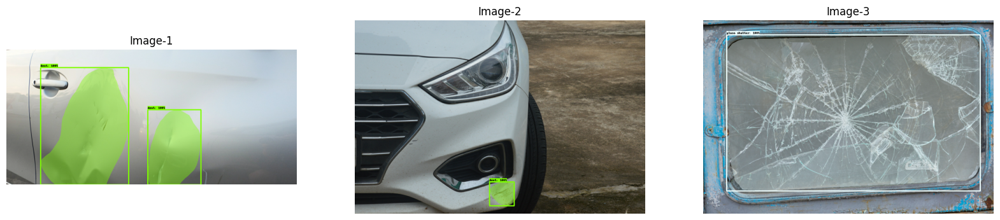

In [ ]:
buffer_size = 100
num_of_examples = 3

train_tfrecords = tf.io.gfile.glob(exp_config.task.train_data.input_path)
raw_records = tf.data.TFRecordDataset(train_tfrecords).shuffle(buffer_size=buffer_size).take(num_of_examples)
show_batch(raw_records)

## Train and evaluate

We follow the COCO challenge tradition to evaluate the accuracy of object detection based on mAP(mean Average Precision). Please check [here](https://cocodataset.org/#detection-eval) for detail explanation of how evaluation metrics for detection task is done.

**IoU**: is defined as the area of the intersection divided by the area of the union of a predicted bounding box and ground truth bounding box.

In [ ]:
#se der erro durante o treinamento em TPU, pode ser necessário dar permissão de Object Admin para o usuário da TPU no Cloud Storage
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='train_and_eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Redu

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
restoring or initializing model...


INFO:tensorflow:Customized initialization is done through the passed `init_fn`.


train | step:      0 | training until step 352...


train | step:    352 | steps/sec:    1.6 | output: 
    {'frcnn_box_loss': 0.28303266,
     'frcnn_cls_loss': 0.07443792,
     'learning_rate': 0.0072807996,
     'mask_loss': 0.63622594,
     'model_loss': 1.2193147,
     'rpn_box_loss': 0.06185225,
     'rpn_score_loss': 0.16376656,
     'total_loss': 1.5194799,
     'training_loss': 1.5194799}
saved checkpoint to gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-352.
 eval | step:    352 | running 101 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.75s).
Accumulating evaluation results...
DONE (t=0.74s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small

## Load logs in tensorboard

In [ ]:
# uri_trained_model = 'gs://car-damage-recognition/trained_model_' + nome_experimento
#para trazer o resultado do treinamento do Cloud Storage para a máquina
# !gsutil cp -r gs://car-damage-recognition/trained_model_resnet50-frozen-backend-batch64 '.'
!gsutil cp -r gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model .

Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/annotation.json...
Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/checkpoint...
Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-13024.data-00000-of-00001...
- [3 files][ 46.3 MiB/ 46.3 MiB]                                                
==> NOTE: You are performing a sequence of gsutil operations that may
run significantly faster if you instead use gsutil -m cp ... Please
see the -m section under "gsutil help options" for further information
about when gsutil -m can be advantageous.

Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-13024.index...
Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-13728.data-0000

In [ ]:
#para funcionar, deve-se permitir cookies de terceiros no navegador
#no Firefox, desativar proteção aprimorada contra rastreamento
%load_ext tensorboard
# %reload_ext tensorboard
# dir_trained_model = "./trained_model_" + nome_experimento
# %tensorboard --logdir trained_model_resnet50-frozen-backend-batch64
%tensorboard --logdir trained_model

<IPython.core.display.Javascript object>

## Saving and exporting the trained model

The `keras.Model` object returned by `train_lib.run_experiment` expects the data to be normalized by the dataset loader using the same mean and variance statiscics in `preprocess_ops.normalize_image(image, offset=MEAN_RGB, scale=STDDEV_RGB)`. This export function handles those details, so you can pass `tf.uint8` images and get the correct results.

In [ ]:
model_dir

'gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/'

In [ ]:
export_dir

'gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/exported_model/'

In [ ]:
export_saved_model_lib.export_inference_graph(
    input_type='image_tensor',
    batch_size=1,
    input_image_size=[HEIGHT, WIDTH],
    params=exp_config,
    checkpoint_path=tf.train.latest_checkpoint(model_dir),
    export_dir=export_dir)

/usr/local/lib/python3.10/dist-packages/keras/src/engine/functional.py:642: UserWarning: Input dict contained keys ['6'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)
/usr/local/lib/python3.10/dist-packages/keras/src/engine/functional.py:642: UserWarning: Input dict contained keys ['6'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)
INFO:tensorflow:Assets written to: gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/exported_model/assets


## Inference from Trained Model

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)



def build_inputs_for_object_detection(image, input_image_size):
  """Builds Object Detection model inputs for serving."""
  image, _ = resize_and_crop_image(
      image,
      input_image_size,
      padded_size=input_image_size,
      aug_scale_min=1.0,
      aug_scale_max=1.0)
  return image

## Importing SavedModel

In [ ]:
imported = tf.saved_model.load(export_dir)
model_fn = imported.signatures['serving_default']

In [ ]:
pp.pprint(model_fn.pretty_printed_signature())

('signature_wrapper(*, inputs)\n'
 '  Args:\n'
 '    inputs: uint8 Tensor, shape=(1, None, None, 3)\n'
 '  Returns:\n'
 "    {'detection_boxes': <1>, 'detection_classes': <2>, 'detection_masks': "
 "<3>, 'detection_scores': <4>, 'image_info': <5>, 'num_detections': <6>}\n"
 '      <1>: float32 Tensor, shape=(1, 100, 4)\n'
 '      <2>: int32 Tensor, shape=(1, 100)\n'
 '      <3>: float32 Tensor, shape=(1, 100, 28, 28)\n'
 '      <4>: float32 Tensor, shape=(1, 100)\n'
 '      <5>: float32 Tensor, shape=(1, 4, 2)\n'
 '      <6>: int32 Tensor, shape=(1,)')


## Visualize test data

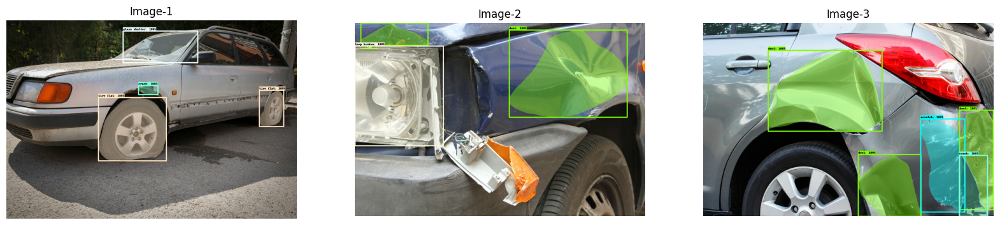

In [ ]:
num_of_examples = 3

# test_tfrecords = tf.io.gfile.glob('./cardd_tfrecords/val*')
#para TPU, lê do Cloud Storage
test_tfrecords = tf.io.gfile.glob('gs://car-damage-recognition/cardd_tfrecords_all_sets/val*')
#
test_ds = tf.data.TFRecordDataset(test_tfrecords).take(num_of_examples)
show_batch(test_ds)

## Visualize predictions

In [ ]:
def reframe_image_corners_relative_to_boxes(boxes):
  """Reframe the image corners ([0, 0, 1, 1]) to be relative to boxes.
  The local coordinate frame of each box is assumed to be relative to
  its own for corners.
  Args:
    boxes: A float tensor of [num_boxes, 4] of (ymin, xmin, ymax, xmax)
      coordinates in relative coordinate space of each bounding box.
  Returns:
    reframed_boxes: Reframes boxes with same shape as input.
  """
  ymin, xmin, ymax, xmax = (boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3])

  height = tf.maximum(ymax - ymin, 1e-4)
  width = tf.maximum(xmax - xmin, 1e-4)

  ymin_out = (0 - ymin) / height
  xmin_out = (0 - xmin) / width
  ymax_out = (1 - ymin) / height
  xmax_out = (1 - xmin) / width
  return tf.stack([ymin_out, xmin_out, ymax_out, xmax_out], axis=1)

def reframe_box_masks_to_image_masks(box_masks, boxes, image_height,
                                     image_width, resize_method='bilinear'):
  """Transforms the box masks back to full image masks.
  Embeds masks in bounding boxes of larger masks whose shapes correspond to
  image shape.
  Args:
    box_masks: A tensor of size [num_masks, mask_height, mask_width].
    boxes: A tf.float32 tensor of size [num_masks, 4] containing the box
           corners. Row i contains [ymin, xmin, ymax, xmax] of the box
           corresponding to mask i. Note that the box corners are in
           normalized coordinates.
    image_height: Image height. The output mask will have the same height as
                  the image height.
    image_width: Image width. The output mask will have the same width as the
                 image width.
    resize_method: The resize method, either 'bilinear' or 'nearest'. Note that
      'bilinear' is only respected if box_masks is a float.
  Returns:
    A tensor of size [num_masks, image_height, image_width] with the same dtype
    as `box_masks`.
  """
  resize_method = 'nearest' if box_masks.dtype == tf.uint8 else resize_method

  def reframe_box_masks_to_image_masks_default():
    """The default function when there are more than 0 box masks."""

    num_boxes = tf.shape(box_masks)[0]
    box_masks_expanded = tf.expand_dims(box_masks, axis=3)

    resized_crops = tf.image.crop_and_resize(
        image=box_masks_expanded,
        boxes=reframe_image_corners_relative_to_boxes(boxes),
        box_indices=tf.range(num_boxes),
        crop_size=[image_height, image_width],
        method=resize_method,
        extrapolation_value=0)
    return tf.cast(resized_crops, box_masks.dtype)

  image_masks = tf.cond(
      tf.shape(box_masks)[0] > 0,
      reframe_box_masks_to_image_masks_default,
      lambda: tf.zeros([0, image_height, image_width, 1], box_masks.dtype))
  return tf.squeeze(image_masks, axis=3)

In [ ]:
input_image_size = (HEIGHT, WIDTH)
plt.figure(figsize=(20, 20))
min_score_thresh = 0.40

for i, serialized_example in enumerate(test_ds):
  plt.subplot(1, 3, i+1)
  decoded_tensors = tf_ex_decoder.decode(serialized_example)
  image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
  image = tf.expand_dims(image, axis=0)
  image = tf.cast(image, dtype = tf.uint8)
  image_np = image[0].numpy()
  result = model_fn(image)
  # Visualize detection and masks
  if 'detection_masks' in result:
    # we need to convert np.arrays to tensors
    detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
    detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])
    detection_masks_reframed = reframe_box_masks_to_image_masks(
              detection_masks, detection_boxes/512.0,
                image_np.shape[0], image_np.shape[1])
    detection_masks_reframed = tf.cast(
        detection_masks_reframed > min_score_thresh,
        np.uint8)

    result['detection_masks_reframed'] = detection_masks_reframed.numpy()
  visualization_utils.visualize_boxes_and_labels_on_image_array(
        image_np,
        result['detection_boxes'][0].numpy(),
        (result['detection_classes'][0] + 0).numpy().astype(int),
        result['detection_scores'][0].numpy(),
        category_index=category_index,
        use_normalized_coordinates=False,
        max_boxes_to_draw=200,
        min_score_thresh=min_score_thresh,
        instance_masks=result.get('detection_masks_reframed', None),
        line_thickness=4)

  plt.imshow(image_np)
  plt.axis("off")

plt.show()

## Exploração

In [ ]:
# guardando uma cópia das variáveis originais
model_old = model
model_fn_old = model_fn
result_old = result

In [ ]:
keylist = list(result_old.keys())
print(keylist)

['detection_boxes', 'num_detections', 'image_info', 'detection_classes', 'detection_masks', 'detection_scores', 'detection_masks_reframed']


In [ ]:
for i, serialized_example in enumerate(test_ds):
  if (i==0):
    decoded_tensors = tf_ex_decoder.decode(serialized_example)
    image = build_inputs_for_object_detection(decoded_tensors['image'], input_image_size)
    image = tf.expand_dims(image, axis=0)
    image = tf.cast(image, dtype = tf.uint8)
    image_np = image[0].numpy()
    result = model_fn(image)

In [ ]:
keylist = list(result.keys())
print(keylist)

['detection_boxes', 'num_detections', 'image_info', 'detection_classes', 'detection_masks', 'detection_scores']


In [ ]:
result['image_info']

<tf.Tensor: shape=(1, 4, 2), dtype=float32, numpy=
array([[[256., 256.],
        [256., 256.],
        [  1.,   1.],
        [  0.,   0.]]], dtype=float32)>

In [ ]:
print(result['num_detections'])

tf.Tensor([8], shape=(1,), dtype=int32)


In [ ]:
print(result['detection_boxes'])

tf.Tensor(
[[[ 48.11154   143.72563    89.43123   218.57733  ]
  [ 68.85987    81.32998   126.57922   136.41208  ]
  [  8.2838745 148.37521    48.460674  243.91835  ]
  [ 51.555      89.79648    94.73407   148.55453  ]
  [ 46.080284    3.248434   74.63268    65.17004  ]
  [ 35.016098   88.11442    66.53714   146.28854  ]
  [  8.290056  150.26283    44.55873   231.67526  ]
  [ 57.387398  141.54646    84.313835  154.91711  ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
  [  0.          0.          0.          0.       ]
 

In [ ]:
detection_masks

<tf.Tensor: shape=(100, 28, 28), dtype=float32, numpy=
array([[[0.03830662, 0.04570583, 0.06117726, ..., 0.03511658,
         0.04462618, 0.04619969],
        [0.04635575, 0.04650893, 0.06878028, ..., 0.03696933,
         0.07128035, 0.06101767],
        [0.03198014, 0.04351221, 0.05232414, ..., 0.07119737,
         0.03937525, 0.04773743],
        ...,
        [0.00545212, 0.01063055, 0.00249404, ..., 0.32026088,
         0.30732927, 0.19036733],
        [0.01092501, 0.01146234, 0.00181194, ..., 0.14794452,
         0.12349233, 0.11533084],
        [0.0088026 , 0.00905285, 0.00261807, ..., 0.08345387,
         0.08774354, 0.0633988 ]],

       [[0.04744498, 0.04785759, 0.02017807, ..., 0.01669052,
         0.01585656, 0.01990075],
        [0.07104052, 0.05718854, 0.03682668, ..., 0.01918097,
         0.02313191, 0.02617533],
        [0.06853274, 0.07849105, 0.04923103, ..., 0.0132942 ,
         0.01749335, 0.0184218 ],
        ...,
        [0.02823977, 0.0291487 , 0.00847675, ..., 0.1

## Teste

In [ ]:
exp_config.task.per_category_metrics = True

# Validation Data Config PARA TESTE
exp_config.task.validation_data.input_path = test_data_input_path
exp_config.task.validation_data.dtype = 'float32'
exp_config.task.validation_data.global_batch_size = 1

In [ ]:
quantidade_exemplos_test = 374
# exp_config.trainer.validation_interval = steps_per_epoch
exp_config.trainer.validation_steps =  quantidade_exemplos_test
#exp_config.trainer.validation_steps =  -1 # consome o dataset inteiro

In [ ]:
nome_experimento_teste = 'experiment-MobileNetV2-unfrozen-GPU-V100-high-ram-test'
model_dir = 'gs://car-damage-recognition/experiments/' + nome_experimento_teste + '/trained_model/'

In [ ]:
!gsutil cp gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/checkpoint gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram-test/trained_model/checkpoint
!gsutil cp gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-15840.data-00000-of-00001 gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram-test/trained_model/ckpt-15840.data-00000-of-00001
!gsutil cp gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-15840.index gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram-test/trained_model/ckpt-15840.index

Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-15840.data-00000-of-00001...
/ [1 files][ 44.6 MiB/ 44.6 MiB]                                                
Operation completed over 1 objects/44.6 MiB.                                     
Copying gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram/trained_model/ckpt-15840.index...
/ [1 files][ 48.9 KiB/ 48.9 KiB]                                                
Operation completed over 1 objects/48.9 KiB.                                     


In [ ]:
with distribution_strategy.scope():
  task = tfm.core.task_factory.get_task(exp_config.task, logging_dir=model_dir)

In [ ]:
model, eval_logs = tfm.core.train_lib.run_experiment(
    distribution_strategy=distribution_strategy,
    task=task,
    mode='eval',
    params=exp_config,
    model_dir=model_dir,
    run_post_eval=True)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
restoring or initializing model...
restored model from gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram-test/trained_model/ckpt-15840.
restored from checkpoint: gs://car-damage-recognition/experiments/experiment-MobileNetV2-unfrozen-GPU-V100-high-ram-test/trained_model/ckpt-15840
 eval | step:  15840 | running 374 steps of evaluation...
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.32s).
Accumulating evaluation results...
DONE (t=0.39s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.544
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.366
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medi